In [6]:
library(downloader)
url <- "https://raw.githubusercontent.com/genomicsclass/dagdata/master/inst/extdata/mice_pheno.csv"
filename <- basename(url)
download(url, destfile=filename)
dat <- na.omit( read.csv(filename) )

In [7]:
head(dat)

,Sex,Diet,Bodyweight
1,F,hf,31.94
2,F,hf,32.48
3,F,hf,22.82
4,F,hf,19.92
5,F,hf,32.22
6,F,hf,27.5


In [10]:
library(dplyr)
controlPop <- filter(dat,Sex=='F' & Diet=='chow') %>% select(Bodyweight) %>% unlist
hfPop <- filter(dat,Sex=='F' & Diet=='hf') %>% select(Bodyweight) %>% unlist


Attaching package: 'dplyr'

The following objects are masked from 'package:stats':

    filter, lag

The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union



In [11]:
mu_hf <- mean(hfPop)
mu_control <- mean(controlPop)
print(mu_hf - mu_control)

[1] 2.375517


In [12]:
library(rafalib)
sd_hf <- popsd(hfPop)
sd_control <- popsd(controlPop)

In [13]:
N <- 12
hf <- sample(hfPop, 12)
control <- sample(controlPop, 12)

Ns <- c(3,12,25,50)
B <- 10000
res <- sapply(Ns, function(n) {
    replicate(B, mean(sample(hfPop, n)) - mean(sample(controlPop,n)))
})


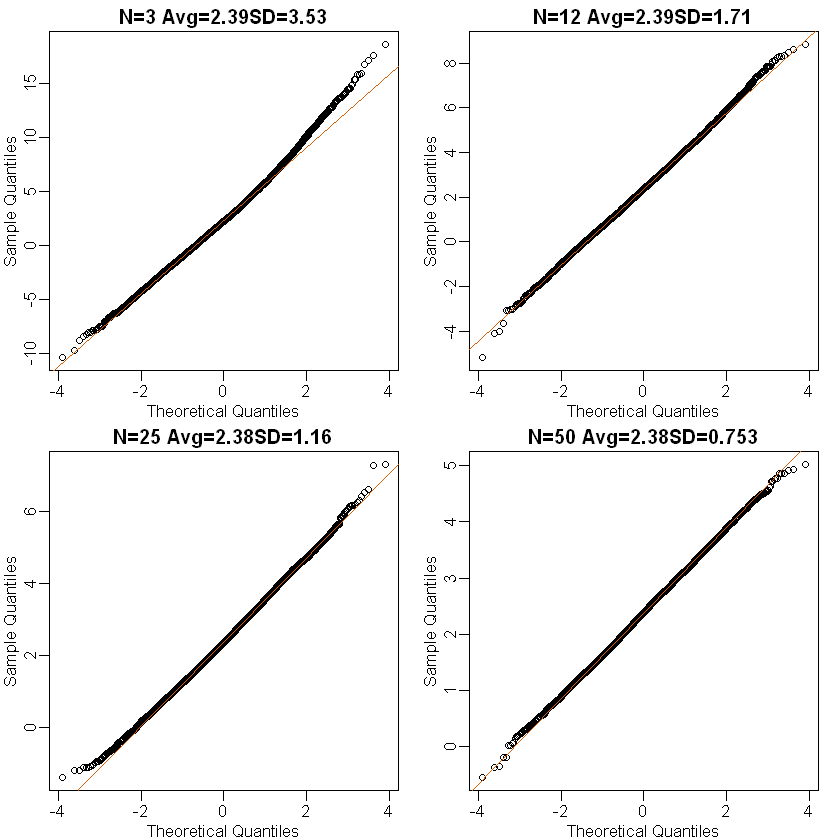

In [14]:
mypar(2,2)
for (i in seq(along=Ns)) {
    titleavg <- signif(mean(res[,i]),3)
    titlesd <- signif(popsd(res[,i]),3)
    title <- paste0('N=', Ns[i], " Avg=",titleavg, 'SD=', titlesd)
    qqnorm(res[,i],main=title)
    qqline(res[,i],col=2)
}